# Neural Composer - Specialist

## Imports

In [1]:
import numpy as np
import datapreparation as dp
import tensorflow as tf
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Dropout, LSTM, TimeDistributed, Activation, Flatten,CuDNNLSTM, concatenate
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import to_categorical


## Load Dataset and composers

In [2]:
dataset = []
dataset = dp.load_all_dataset('datasets/training/piano_roll_fs5')

In [3]:
composers = dp.load_all_dataset_names('datasets/training/piano_roll_fs5')
num = 0
composers_dict = {}
for composer in composers:
    if not composer in composers_dict:
        composers_dict[composer] = num
        num += 1
composers = to_categorical(np.array(list(map(lambda c: composers_dict[c],composers))))
print(composers.shape)
print(len(composers))

(43, 4)
43


In [788]:
dp.embed_play_v1(dataset[5])

## Parameters

In [670]:
timesteps = 12
num_notes = 128

## Prepare Dataset

In [671]:
X_train = []
y_train = []
X_train_comp = []

for m in range(len(dataset)):
    melody = dataset[m]
    melody = melody.T.astype(int)
    for i in range(timesteps, len(melody)):
        X_train.append(melody[i-timesteps:i])
        y_train.append(melody[i])
        X_train_comp.append([composers[m]]*timesteps)

        """
        r = np.random.randint(4)
        if np.random.randint(3) is 0:
            t = []
            for key in melody[i-timesteps:i]:
                t.append(np.append(key[12:],[0]*12))
          
            X_train.append(t)
            y_train.append(np.append(melody[i][12:],[0]*12))
        elif r is 1:
            t = []
            for key in melody[i-timesteps:i]:
                t.append(np.append([0]*12, key[:-12]))
          
            X_train.append(t)
            y_train.append(np.append([0]*12, melody[i][:-12]))
        """
X_train = np.array(X_train)
X_train_comp = np.array(X_train_comp)
y_train = np.array(y_train)

print(X_train.shape)
print(X_train_comp.shape)
print(y_train.shape)

(68649, 12, 128)
(68649, 12, 4)
(68649, 128)


## Design model

In [672]:
notes_input = Input(shape=(timesteps,num_notes), name="notes")
comp_input = Input(shape=(timesteps,4), name="comp")

x = concatenate([notes_input, comp_input], axis=-1)

x = CuDNNLSTM(256, input_shape=(timesteps,num_notes+4), return_sequences=True)(x)
x = CuDNNLSTM(128, return_sequences=True)(x)
x = CuDNNLSTM(128, return_sequences=False)(x)
x = Dense(128, activation='relu')(x)
finalOutput = Dense(num_notes, activation='sigmoid')(x)

model = Model(inputs=[notes_input, comp_input], outputs=[finalOutput])
model.compile(optimizer='rmsprop', loss='binary_crossentropy')
print(model.summary())



__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
notes (InputLayer)              (None, 12, 128)      0                                            
__________________________________________________________________________________________________
comp (InputLayer)               (None, 12, 4)        0                                            
__________________________________________________________________________________________________
concatenate_3 (Concatenate)     (None, 12, 132)      0           notes[0][0]                      
                                                                 comp[0][0]                       
__________________________________________________________________________________________________
cu_dnnlstm_9 (CuDNNLSTM)        (None, 12, 256)      399360      concatenate_3[0][0]              
__________

## Train model

In [697]:
history_object = model.fit([X_train,X_train_comp], y_train, validation_split=0, shuffle=True, epochs=100, verbose=2, batch_size=1000)

Epoch 1/100
 - 1s - loss: 0.0065
Epoch 2/100
 - 1s - loss: 0.0064
Epoch 3/100
 - 1s - loss: 0.0063
Epoch 4/100
 - 1s - loss: 0.0062
Epoch 5/100
 - 1s - loss: 0.0060
Epoch 6/100
 - 1s - loss: 0.0060
Epoch 7/100
 - 1s - loss: 0.0059
Epoch 8/100
 - 1s - loss: 0.0058
Epoch 9/100
 - 1s - loss: 0.0057
Epoch 10/100
 - 1s - loss: 0.0056
Epoch 11/100
 - 1s - loss: 0.0055
Epoch 12/100
 - 1s - loss: 0.0054
Epoch 13/100
 - 1s - loss: 0.0053
Epoch 14/100
 - 1s - loss: 0.0052
Epoch 15/100
 - 1s - loss: 0.0052
Epoch 16/100
 - 1s - loss: 0.0051
Epoch 17/100
 - 1s - loss: 0.0051
Epoch 18/100
 - 1s - loss: 0.0049
Epoch 19/100
 - 1s - loss: 0.0048
Epoch 20/100
 - 1s - loss: 0.0048
Epoch 21/100
 - 1s - loss: 0.0047
Epoch 22/100
 - 1s - loss: 0.0047
Epoch 23/100
 - 1s - loss: 0.0047
Epoch 24/100
 - 1s - loss: 0.0046
Epoch 25/100
 - 1s - loss: 0.0044
Epoch 26/100
 - 1s - loss: 0.0045
Epoch 27/100
 - 1s - loss: 0.0044
Epoch 28/100
 - 1s - loss: 0.0045
Epoch 29/100
 - 1s - loss: 0.0043
Epoch 30/100
 - 1s - lo

## Plot results

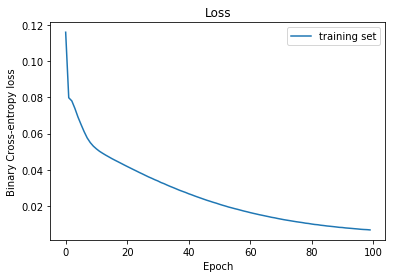

In [674]:
plt.plot(history_object.history['loss'])
plt.title('Loss')
plt.ylabel('Binary Cross-entropy loss')
plt.xlabel('Epoch')
plt.legend(['training set', 'validation set'], loc='upper right')
plt.show()

## Generate Music!

### Parameters

In [1074]:
init_song = dataset[27]
init_part = 0

song_length = 80
notes_per_time = 2
prob_threshold = 0.35
use_threshold = True


comp = [0,0,0,1]


In [1075]:
song = list(init_song.T[init_part:init_part+timesteps])

for i in range(song_length):
        
    composer = np.array([[comp]*timesteps])
    notes = np.array([song[-timesteps:]])
    prediction = model.predict([notes,composer])
    
    if use_threshold:
        notes = prediction[0] > prob_threshold
    else:
        notes = np.argsort(prediction[0])[-notes_per_time:]
    new = np.zeros(num_notes)
    new[notes] = 1
    song.append(new.astype(int))    

song = np.array(song[timesteps:])

print(song.shape)
dp.embed_play_v1(song.T)

(80, 128)


### Visualize Song

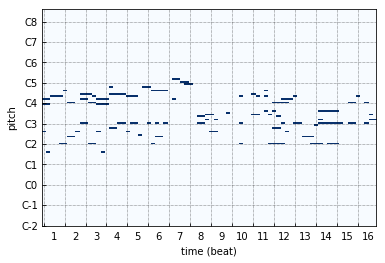

In [1076]:
dp.visualize_piano_roll(song.T,fs=5)

In [1077]:
### 0 0.25
### 8 0.66
## 17 0.45
## 27 0.35

### Save Model

In [711]:
model.save('special_200.h5')

### Load Model

In [1180]:
model = load_model('general_100.h5')